# About the Data:-
The first dataset (WUZZUF) includes:

WuzzufJobPosts_Sample : a sample of jobs posted on WUZZUF during 2014-2016.

WuzzufApplicationsSample : the corresponding applications (Excluding some entries).

Note: The jobs are mainly in Egypt but other locations are included.

Note: This Exploration is only about WuzzufJobPosts_Sample dataset



The second dataset (timesData) includes:
country:country of each university

teaching:university score for teaching (the learning environment)

international:university score international outlook (staff, students, research)

citations: university score for citations (research influence)

research:university score for research (volume, income and reputation)

income:university score for industry income (knowledge transfer)

total_score:total score for university, used to determine rank

num_students:number of students at the university

## Importing libraries:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
import plotly.graph_objs as go

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Gathering:

In [3]:
df=pd.read_csv('Wuzzuf_Job_Posts_Sample.csv')

# Assessing Data:

In [4]:
df.head()

,id,city,job_title,job_category1,job_category2,job_category3,job_industry1,job_industry2,job_industry3,salary_minimum,salary_maximum,num_vacancies,career_level,experience_years,post_date,views,job_description,job_requirements,payment_period,currency
0,516e4ed,Ciro,Sales & Marketing Agent,Sales/Retail/Business Development,Marketing,Select,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,<p><strong>Qualifications</strong>:<br /><br /...,NaN,Per Month,Egyptian Pound
1,a361ef59,Cairo,German Training Coordinator,Customer Service/Support,Administration,Human Resources,Translation and Localization,Business Services - Other,Education,1000,5000,8,Entry Level,0-2,2014-01-01 20:01:18,2213,<p>&bull;Placing jobs' ads on various websites...,NaN,Per Month,Egyptian Pound
2,7226ce78,Cairo,Junior Software Developer,IT/Software Development,Select,Select,Computer Software,Select,Select,2000,2500,1,Entry Level,2,2014-01-02 11:01:03,2940,"<span style=""text-decoration: underline;""><str...",NaN,Per Month,Egyptian Pound
3,f4b2bcd6,Cairo,Application Support Engineer,IT/Software Development,Select,Select,Telecommunications Services,Select,Select,2000,3500,1,Entry Level,1-2,2014-01-02 12:01:23,2042,"<strong><span style=""text-decoration: underlin...",NaN,Per Month,Egyptian Pound
4,3fee6f73,Alexandria,Electrical Maintenance Engineer,Engineering,Select,Select,Food and Beverage Production,Select,Select,5000,8000,1,Experienced (Non-Manager),1-3,2014-01-21 13:45:56,5684,Job Title: Electrical Maintenance Engineer<br ...,NaN,Per Month,Egyptian Pound


### Using info(): to know columns names ,datatypes and the non null count.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21850 entries, 0 to 21849
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                21850 non-null  object
 1   city              21850 non-null  object
 2   job_title         21850 non-null  object
 3   job_category1     21850 non-null  object
 4   job_category2     21850 non-null  object
 5   job_category3     21850 non-null  object
 6   job_industry1     21850 non-null  object
 7   job_industry2     21850 non-null  object
 8   job_industry3     21850 non-null  object
 9   salary_minimum    21850 non-null  int64 
 10  salary_maximum    21850 non-null  int64 
 11  num_vacancies     21850 non-null  int64 
 12  career_level      21850 non-null  object
 13  experience_years  21850 non-null  object
 14  post_date         21850 non-null  object
 15  views             21850 non-null  int64 
 16  job_description   21576 non-null  object
 17  job_requirem

### Using describe(): to know the summation of each column ,if there missing value or not , And some statistics operations like(mean,max,min,….)

In [6]:
df.describe()

,salary_minimum,salary_maximum,num_vacancies,views
count,21850.000000,21850.000000,21850.000000,21850.000000
mean,3333.283982,5476.040412,5.856934,1376.874737
std,5293.894787,10783.029504,16.633904,1065.109847
min,0.000000,0.000000,1.000000,0.000000
25%,1500.000000,2500.000000,1.000000,797.000000
50%,2500.000000,4000.000000,1.000000,1230.000000
75%,3500.000000,6000.000000,3.000000,1791.000000
max,250000.000000,1000000.000000,100.000000,37568.000000


### using duplicated():to know if there any duplicated value.

In [7]:
df.duplicated().value_counts()

False    21850
dtype: int64

## Data issues:-
##### 1- wrong data types in some columns
##### 2- some columns that do not affect the analysis need to be dropped
##### 3-job_category columns have some irrelevant data
##### 4-job_category1 need to be fixed (the categories is in one cell and need to be separated ) 
##### 5-the same isuues in job industry columns
##### 6-city column in inconsistent

# Cleaning 

In [8]:
#drop useless columns
df.drop(['job_description','job_requirements'],axis=1,inplace=True)
df.head()


,id,city,job_title,job_category1,job_category2,job_category3,job_industry1,job_industry2,job_industry3,salary_minimum,salary_maximum,num_vacancies,career_level,experience_years,post_date,views,payment_period,currency
0,516e4ed,Ciro,Sales & Marketing Agent,Sales/Retail/Business Development,Marketing,Select,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
1,a361ef59,Cairo,German Training Coordinator,Customer Service/Support,Administration,Human Resources,Translation and Localization,Business Services - Other,Education,1000,5000,8,Entry Level,0-2,2014-01-01 20:01:18,2213,Per Month,Egyptian Pound
2,7226ce78,Cairo,Junior Software Developer,IT/Software Development,Select,Select,Computer Software,Select,Select,2000,2500,1,Entry Level,2,2014-01-02 11:01:03,2940,Per Month,Egyptian Pound
3,f4b2bcd6,Cairo,Application Support Engineer,IT/Software Development,Select,Select,Telecommunications Services,Select,Select,2000,3500,1,Entry Level,1-2,2014-01-02 12:01:23,2042,Per Month,Egyptian Pound
4,3fee6f73,Alexandria,Electrical Maintenance Engineer,Engineering,Select,Select,Food and Beverage Production,Select,Select,5000,8000,1,Experienced (Non-Manager),1-3,2014-01-21 13:45:56,5684,Per Month,Egyptian Pound


In [9]:
df_1=df

# 

In [10]:
#put job_category elemmnts in a list
df['job_category']=df['job_category1']+'/'+df['job_category2']+'/'+df['job_category3']
df.drop(['job_category1','job_category2','job_category3'],axis=1,inplace=True)
sub_df=df[['id','job_category']]
sub_df['job_category']=sub_df['job_category'].str.split('/')
sub_df

,id,job_category
0,516e4ed,"[Sales, Retail, Business Development, Marketin..."
1,a361ef59,"[Customer Service, Support, Administration, Hu..."
2,7226ce78,"[IT, Software Development, Select, Select]"
3,f4b2bcd6,"[IT, Software Development, Select, Select]"
4,3fee6f73,"[Engineering, Select, Select]"
...,...,...
21845,cbbac897,"[Creative, Design, Select, Select]"
21846,7724db49,"[Quality Assurance, Quality Control, Biotech, ..."
21847,a6911086,"[Administration, Marketing, Sales, Retail, Bus..."
21848,6dcdc323,"[Marketing, Select, Select]"


In [11]:
#put every job_category in a row so we can put insights according to it
iterator=0
flat_list_jc=[]
flat_list_id=[]
job_category=list(sub_df['job_category'])
while iterator < 21850 :
    for i in job_category[iterator]:
        flat_list_jc.append(i)
        flat_list_id.append(sub_df.iloc[iterator][0])
    iterator=iterator+1       

In [12]:
#zip() function creates the objects and that can be used to produce single item at a time.
#This function can create pandans DataFrames by merging two lists.
t_df= pd.DataFrame(list(zip(flat_list_id, flat_list_jc)),columns =['id', 'job_category'])
t_df.head()

,id,job_category
0,516e4ed,Sales
1,516e4ed,Retail
2,516e4ed,Business Development
3,516e4ed,Marketing
4,516e4ed,Select


In [13]:
df.drop('job_category',axis=1,inplace=True)
semi_final_df=pd.merge(t_df,df,on='id',how='left')

In [14]:
semi_final_df.head()

,id,job_category,city,job_title,job_industry1,job_industry2,job_industry3,salary_minimum,salary_maximum,num_vacancies,career_level,experience_years,post_date,views,payment_period,currency
0,516e4ed,Sales,Ciro,Sales & Marketing Agent,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
1,516e4ed,Retail,Ciro,Sales & Marketing Agent,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
2,516e4ed,Business Development,Ciro,Sales & Marketing Agent,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
3,516e4ed,Marketing,Ciro,Sales & Marketing Agent,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
4,516e4ed,Select,Ciro,Sales & Marketing Agent,Telecommunications Services,Select,Select,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound


In [15]:

ind=semi_final_df[semi_final_df['job_category']=='Select'].index
semi_final_df.drop(ind,inplace=True)

In [16]:
#do the same thing to job_industry column
semi_final_df['job_industry']=semi_final_df['job_industry1']+'/'+semi_final_df['job_industry2']+'/'+semi_final_df['job_industry3']
semi_final_df.drop(['job_industry1','job_industry2','job_industry3'],axis=1,inplace=True)
sub_df=semi_final_df[['id','job_industry']]
sub_df['job_industry']=sub_df['job_industry'].str.split('/')
sub_df

,id,job_industry
0,516e4ed,"[Telecommunications Services, Select, Select]"
1,516e4ed,"[Telecommunications Services, Select, Select]"
2,516e4ed,"[Telecommunications Services, Select, Select]"
3,516e4ed,"[Telecommunications Services, Select, Select]"
5,a361ef59,"[Translation and Localization , Business Ser..."
...,...,...
96873,eb59b18d,"[Computer, IT Services, Information Technology..."
96874,eb59b18d,"[Computer, IT Services, Information Technology..."
96875,eb59b18d,"[Computer, IT Services, Information Technology..."
96876,eb59b18d,"[Computer, IT Services, Information Technology..."


In [17]:
iterator=0
flat_list_jc=[]
flat_list_id=[]
job_category=list(sub_df['job_industry'])
while iterator < 21850 :
    for i in job_category[iterator]:
        flat_list_jc.append(i)
        flat_list_id.append(sub_df.iloc[iterator][0])
    iterator=iterator+1       

In [18]:
t_df= pd.DataFrame(list(zip(flat_list_id, flat_list_jc)),columns =['id', 'job_industry'])
t_df.head()

,id,job_industry
0,516e4ed,Telecommunications Services
1,516e4ed,Select
2,516e4ed,Select
3,516e4ed,Telecommunications Services
4,516e4ed,Select


In [19]:
semi_final_df.drop('job_industry',axis=1,inplace=True)
final_df=pd.merge(t_df,semi_final_df,on='id',how='left')
ind=final_df[final_df['job_industry']=='Select'].index
final_df.drop(ind,inplace=True)
final_df

,id,job_industry,job_category,city,job_title,salary_minimum,salary_maximum,num_vacancies,career_level,experience_years,post_date,views,payment_period,currency
0,516e4ed,Telecommunications Services,Sales,Ciro,Sales & Marketing Agent,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
1,516e4ed,Telecommunications Services,Retail,Ciro,Sales & Marketing Agent,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
2,516e4ed,Telecommunications Services,Business Development,Ciro,Sales & Marketing Agent,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
3,516e4ed,Telecommunications Services,Marketing,Ciro,Sales & Marketing Agent,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
12,516e4ed,Telecommunications Services,Sales,Ciro,Sales & Marketing Agent,2000,3500,8,Entry Level,0-1,2014-01-01 06:01:41,2602,Per Month,Egyptian Pound
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270417,7e5075f5,Computer Software,IT,Giza,JavaScript Software Developer,5000,15000,3,Experienced (Non-Manager),4+,2015-02-15 14:02:26,0,Per Month,Egyptian Pound
270418,7e5075f5,Computer Software,Software Development,Giza,JavaScript Software Developer,5000,15000,3,Experienced (Non-Manager),4+,2015-02-15 14:02:26,0,Per Month,Egyptian Pound
270419,7e5075f5,Computer Software,Engineering,Giza,JavaScript Software Developer,5000,15000,3,Experienced (Non-Manager),4+,2015-02-15 14:02:26,0,Per Month,Egyptian Pound
270426,3398d4fe,Information Technology Services,IT,Cairo,Senior .Net Developer,3000,5000,2,Experienced (Non-Manager),2-4,2015-02-15 14:23:01,656,Per Month,Egyptian Pound


In [20]:
#correcting the data types
df_1['post_date']=pd.to_datetime(df_1['post_date'])
df_1['year']=df_1['post_date'].dt.year
df_1['month']=df_1['post_date'].dt.month

In [21]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21850 entries, 0 to 21849
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                21850 non-null  object        
 1   city              21850 non-null  object        
 2   job_title         21850 non-null  object        
 3   job_industry1     21850 non-null  object        
 4   job_industry2     21850 non-null  object        
 5   job_industry3     21850 non-null  object        
 6   salary_minimum    21850 non-null  int64         
 7   salary_maximum    21850 non-null  int64         
 8   num_vacancies     21850 non-null  int64         
 9   career_level      21850 non-null  object        
 10  experience_years  21850 non-null  object        
 11  post_date         21850 non-null  datetime64[ns]
 12  views             21850 non-null  int64         
 13  payment_period    21845 non-null  object        
 14  currency          2184

In [22]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 157735 entries, 0 to 270427
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                157735 non-null  object
 1   job_industry      157735 non-null  object
 2   job_category      157735 non-null  object
 3   city              157735 non-null  object
 4   job_title         157735 non-null  object
 5   salary_minimum    157735 non-null  int64 
 6   salary_maximum    157735 non-null  int64 
 7   num_vacancies     157735 non-null  int64 
 8   career_level      157735 non-null  object
 9   experience_years  157735 non-null  object
 10  post_date         157735 non-null  object
 11  views             157735 non-null  int64 
 12  payment_period    157735 non-null  object
 13  currency          157735 non-null  object
dtypes: int64(4), object(10)
memory usage: 18.1+ MB


In [23]:
final_df['city'].value_counts().head(6)

Cairo             107329
Giza               26340
Alexandria          5306
New Cairo           1763
6th of October      1738
Mansoura             625
Name: city, dtype: int64

In [24]:
final_df['job_industry'].value_counts()

Computer Software                     13365
Information Technology Services       13306
IT Services                            9409
Computer                               9409
Telecommunications Services            6164
                                      ...  
Law Enforcement                           9
Military                                  9
Secondary Education                       5
Primary                                   5
Alternative Medicine                      4
Name: job_industry, Length: 128, dtype: int64

In [25]:
#put experiences in a limit so can put isights according to it
import re 
l = final_df.experience_years.values
range_exps =[]
for i in l:
    pattern =re.findall('\\b\\d+\\b', i)
    if len(pattern) == 0:
        #min_exp = min([int(s) for s in i if s.isdigit()])
        max_exp = max([int(s) for s in i if s.isdigit()])
    else:
        #min_exp = min([int(s) for s in pattern])
        max_exp = max([int(s) for s in pattern])
    # check for the + sign
    if '+' in i:
        max_exp += 3
    # add to our cleaned list
    if max_exp == 0 :
        range_exp = 'Fresh'
    elif 0 < max_exp <= 5:
        range_exp = 'below 5'
    elif 5 < max_exp <= 10:
        range_exp = '5-10'
    elif 10 < max_exp <= 15:
        range_exp = '10-15'
    elif 15 < max_exp <= 20:
        range_exp = '15-20'
    elif 20 < max_exp <= 25:
        range_exp = '20-25'
    else:
        range_exp = 'above 25'
    range_exps.append(range_exp)

In [26]:
len(range_exps) == final_df.shape[0]

True

In [27]:
final_df['experience_range'] = range_exps

In [28]:
final_df.experience_range.unique()

array(['below 5', '5-10', '10-15', 'Fresh', '20-25', '15-20'],
      dtype=object)

In [29]:
final_df['experience_range'].value_counts()


below 5    115901
5-10        35716
10-15        4277
15-20         964
Fresh         706
20-25         171
Name: experience_range, dtype: int64

In [30]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 157735 entries, 0 to 270427
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                157735 non-null  object
 1   job_industry      157735 non-null  object
 2   job_category      157735 non-null  object
 3   city              157735 non-null  object
 4   job_title         157735 non-null  object
 5   salary_minimum    157735 non-null  int64 
 6   salary_maximum    157735 non-null  int64 
 7   num_vacancies     157735 non-null  int64 
 8   career_level      157735 non-null  object
 9   experience_years  157735 non-null  object
 10  post_date         157735 non-null  object
 11  views             157735 non-null  int64 
 12  payment_period    157735 non-null  object
 13  currency          157735 non-null  object
 14  experience_range  157735 non-null  object
dtypes: int64(4), object(11)
memory usage: 19.3+ MB


In [31]:
Top10_jobs=final_df.job_category.sort_values().value_counts().head(10)
Top10_jobs


Software Development    13352
IT                      13352
Business Development    11897
Sales                   11897
Retail                  11897
Engineering             11681
Customer Service        10395
Support                 10395
Marketing                6928
Design                   4407
Name: job_category, dtype: int64

In [32]:
Top10_salary=final_df.salary_maximum.sort_values().value_counts().head(10)
Top10_salary

3000     19546
5000     17765
4000     15075
2500     14333
2000     11539
6000     11020
1500      9855
3500      9678
7000      6477
10000     6066
Name: salary_maximum, dtype: int64

# 


# 1) univariate 

# 

## What is the most popular job industries?
###### it's obvious that computer science, IT services, and computer-related industries are the most popular industries on WUZZUF
###### then we have  marketing , engineering & education 
###### then business-related industries
### Marks:
###### Line
### Channels:
###### Length -Vertically
### Task:
##### compare, lookup values

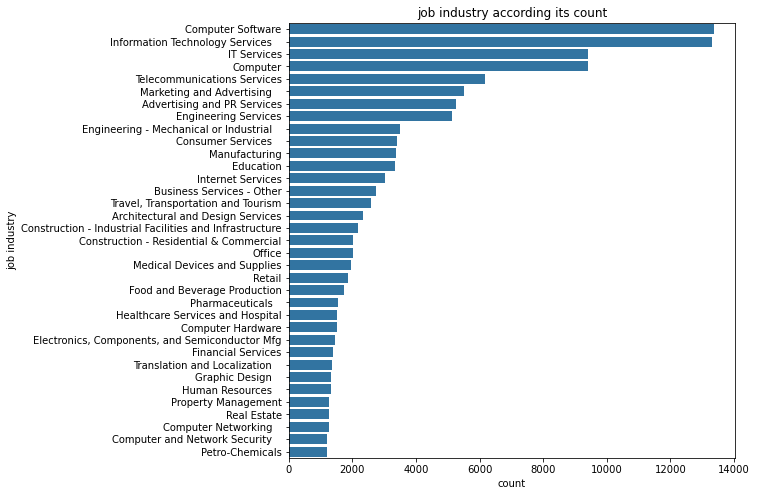

In [33]:
plt.figure(figsize=[8,8])
order=final_df['job_industry'].value_counts()
order=pd.DataFrame(order)
order=order.head(35)
order=order.index
blue=sb.color_palette()[0]
sb.countplot(data=final_df,y='job_industry',order=order,color=blue);
plt.title("job industry according its count");
plt.ylabel('job industry');

# 

### What is the most popular job categories ?

###### software-related categories are the most popular
###### then business-related 
###### then engineering
### Marks:
###### Line
### Channels:
###### Length -Vertically
### Task:
##### compare, lookup values

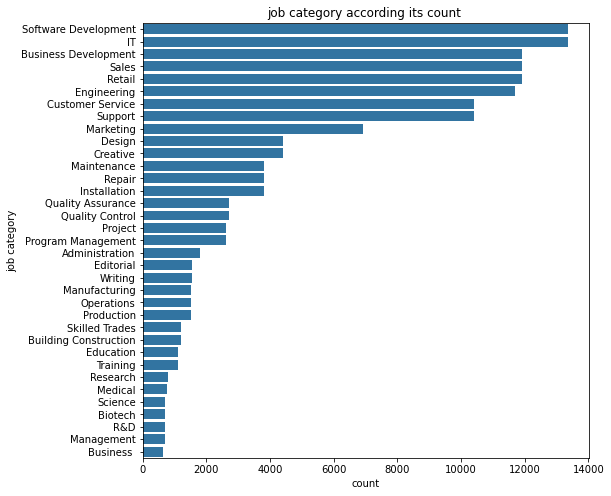

In [34]:
plt.figure(figsize=[8,8])
order=final_df['job_category'].value_counts()
order=pd.DataFrame(order)
order=order.head(35)
order=order.index
sb.countplot(data=final_df,y='job_category',order=order,color=blue);
plt.title("job category according its count ");
plt.ylabel('job category');

## What is the Top 10 popular job categories ?
##### 1)IT&Software Development
##### 2)Business Development
##### 3)Sales
##### 4)Retail
##### 5)Engineering 
##### 6)Customer Service
##### 7)Support 
##### 8)Marketing
##### 9)Design
### Marks:
###### Line
### Channels:
###### Length -Horizontal-colors
### Task:
##### compare, lookup values

In [35]:
jobs=['IT','Software Development','Business Development','Sales' ,'Retail' ,'Engineering','Customer Service','Support','Marketing','Design']
fig = px.bar(x=jobs,y=Top10_jobs,color=jobs)
# Create the dropdown
dropdown_buttons = [
{'label': 'All','method': 'update','args': [{'visible': [True, True, True,True, True,True, True,True,True,True]},{'title': 'All'}]},    
{'label': 'IT','method': 'update','args': [{'visible': [True,False, False,False, False,False, False,False,False, False]},{'title': 'IT'}]},
{'label': 'Software Development','method': 'update','args': [{'visible': [False, True, False,False, False,False, False,False,False, False]},{'title': 'Software Development'}]},
{'label': "Business Development",'method': "update",'args': [{"visible": [False, False, True,False, False,False, False,False,False, False]},{'title': 'Business Development'}]},
{'label': 'Sales','method': 'update','args': [{'visible': [False, False, False,True, False,False, False,False,False, False]},{'title': 'Sales'}]},
{'label': 'Retail','method': 'update','args': [{'visible': [False, False, False,False, True,False, False,False,False, False]},{'title': 'Retail'}]},
{'label': 'Engineering','method': 'update','args': [{'visible': [False, False, False,False, False,True, False,False,False, False]},{'title': 'Engineering'}]},
{'label': 'Customer Service','method': 'update','args': [{'visible': [False, False, False,False, False,False,True,False,False, False]},{'title': 'Customer Service'}]},
{'label': 'Support','method': 'update','args': [{'visible': [False, False, False,False, False,False,False,True,False,False]},{'title': 'Support'}]},
{'label': 'Marketing','method': 'update','args': [{'visible': [False,False,False,False, False,False, False,False,True,False]},{'title': 'Marketing'}]},
{'label': 'Design','method': 'update','args': [{'visible': [False, False, False,False, False,False,False,False, False,True]},{'title': 'Design'}]}
]
fig.update_layout({'updatemenus':[{'type': "dropdown",'x':1.3,'y': 0.35,'showactive': True,'active': 0,'buttons': dropdown_buttons}]
})
fig.show()



# 

### What is the most active cities in posting jobs?
###### You can see that Cairo, Giza & Alexandria are more active in posing jobs than the others
### Marks:
###### Text
### Channels:
###### size-colors
### Task:
##### give greater prominence to words that appear more frequently in a source text.


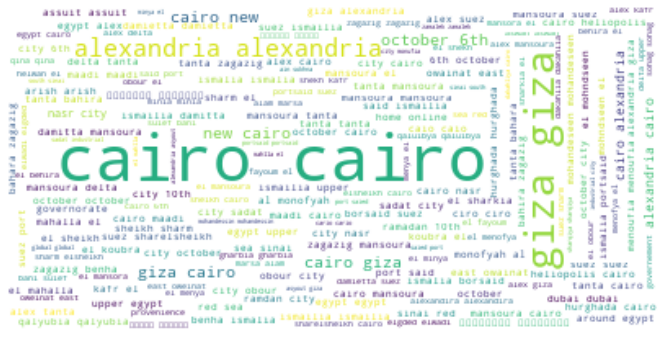

In [36]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
c_list=[]
for i in final_df['city']:
    c_list.append(i.lower())
   
plt.figure(figsize=[18,6]);
words = ' '.join(c_list);


# Generate a word cloud image
wordcloud = WordCloud().generate(words)


# lower max_font_size
wordcloud = WordCloud(max_font_size=40,background_color="white").generate(words)

plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")

plt.show()

# 

### What is the top job titles ?
###### Call center , sales engineer, customer servies, graphing designer and social media
### Marks:
###### Text
### Channels:
###### Size -colors
### Task:
##### give greater prominence to words that appear more frequently in a source text.

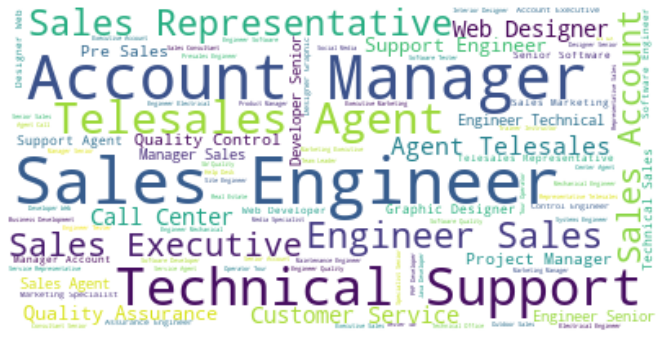

In [37]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.figure(figsize=[18,6]);
words = ' '.join(final_df['job_title']);


# Generate a word cloud image
wordcloud = WordCloud().generate(words)


# lower max_font_size
wordcloud = WordCloud(max_font_size=40,background_color="white").generate(words)

plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")

plt.show()

# 

### Describe Minimum & Maximum salary in Egyptian Pound
###### - in minimum salaries  the majority From 1000 LE to 3500 LE vs from 2000 LE to 6000 LE in maximum salaries 
###### - in minimum salaries, from 3500 LE to 8000 LE is common knowing it's reducing starting from 3500 LE , after 8000 LE is rare
###### -in maximum salaries, from 6000 LE to 8000 LE  is common also 10000 , knowing it's reducing starting from 6000 , after 10000 is rare
### Marks:
###### Line
### Channels:
###### Length -Horizontal-color
### Task:
##### compare, lookup values

In [38]:
sub_df=final_df[final_df['salary_maximum']<=11000]
sub_df=sub_df[['salary_maximum','currency']]
s=px.histogram(data_frame=sub_df,x='salary_maximum',color='currency',nbins=20,title='distribution of salary maximum')
s.show()

In [39]:
sub_df=final_df[final_df['salary_minimum']<=9000]
sub_df=sub_df[['salary_minimum','currency']]
s=px.histogram(data_frame=sub_df,x='salary_minimum',color='currency',nbins=15,title='distribution of salary minimum')
s.show()

# 

# 

### what is the chance for a fresh grad to get a job ?
###### actually, there are huge amount of opportunities for the fresh grad to get a job as the figure shows 
### Marks:
###### Line
### Channels:
###### Length -Horizontal
### Task:
##### compare, lookup values

In [40]:
px.histogram(data_frame=final_df,x='experience_range')

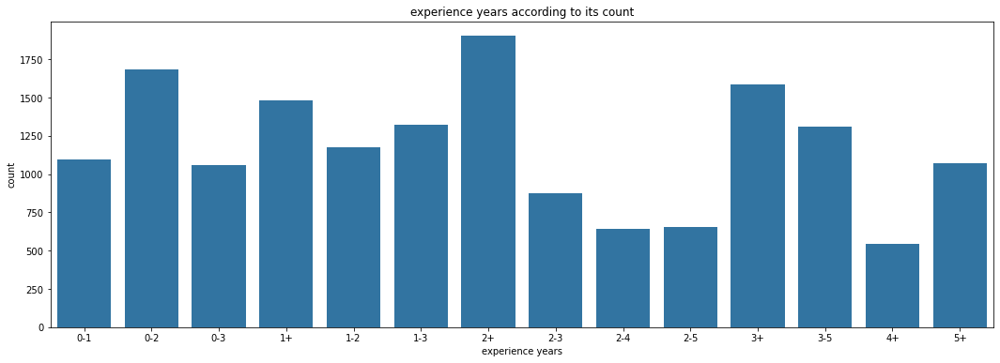

In [41]:
E_Y=pd.DataFrame(df_1['experience_years'].value_counts()).head(14)
E_Y['experience_level']=E_Y.index
plt.figure(figsize=[18,6]);
E_Y.index=np.arange(1,15,1)
sb.barplot(data=E_Y,x='experience_level',y='experience_years',color=blue,order=['0-1','0-2','0-3','1+','1-2','1-3','2+',
                                                                                '2-3','2-4','2-5','3+','3-5','4+','5+']);
plt.xlabel('experience years');
plt.ylabel('count');
plt.title('experience years according to its count');

# 

# 2) Bivariate 

# 

### What are the most profitable jobs?
###### - sports jobs have the highest minimum salary then manegment then business-related
###### - training jobs have the highest maximum salary then education-related then business-related
### Marks:
###### Line
### Channels:
###### Length -vertically
### Task:
##### compare, lookup values

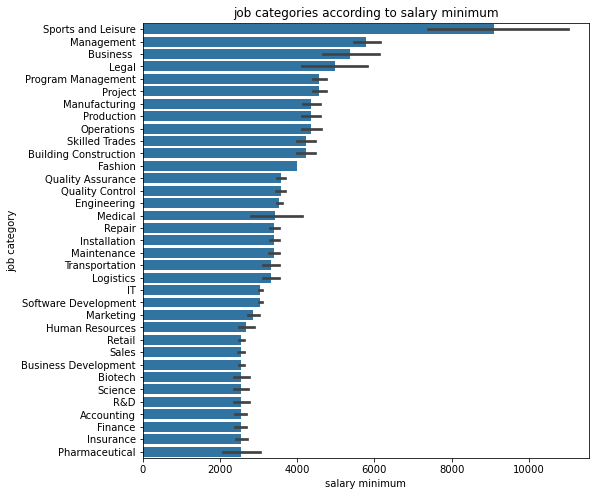

In [42]:
plt.figure(figsize=[8,8]);
result = final_df.groupby(["job_category"])['salary_minimum'].aggregate(np.mean).reset_index().sort_values('salary_minimum',ascending=False);
result=result.head(35)
sb.barplot(y='job_category',x="salary_minimum", data=final_df, order=result['job_category'],color=blue);
plt.title('job categories according to salary minimum');
plt.ylabel('job category');
plt.xlabel('salary minimum');

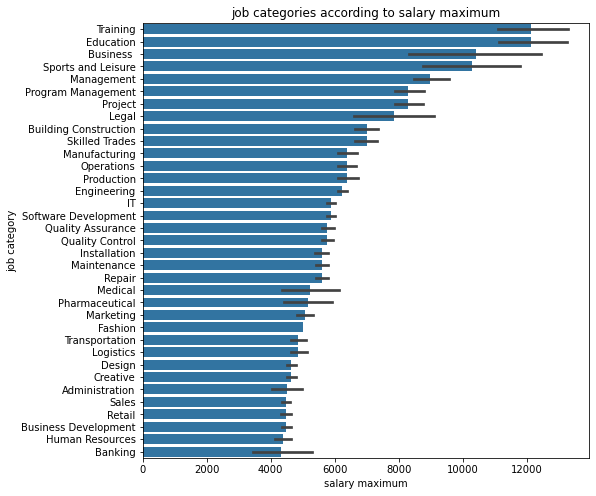

In [43]:
plt.figure(figsize=[8,8]);
result = final_df.groupby(["job_category"])['salary_maximum'].aggregate(np.mean).reset_index().sort_values('salary_maximum',ascending=False);
result=result.head(35)
sb.barplot(y='job_category',x="salary_maximum", data=final_df, order=result['job_category'],color=blue);
plt.title('job categories according to salary maximum');
plt.ylabel('job category');
plt.xlabel('salary maximum');

# 

### Describe the difference in salaries for different career levels 

###### salaries are increasing exponentially 
### Marks:
###### Line
### Channels:
###### Length -Horizontal
### Task:
##### compare, lookup values

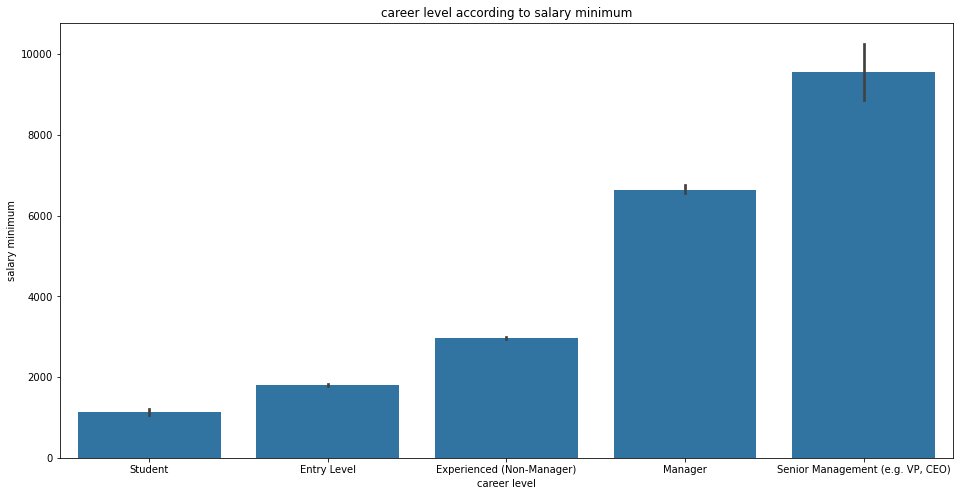

In [44]:
plt.figure(figsize=[16,8]);
result = final_df.groupby(["career_level"])['salary_minimum'].aggregate(np.mean).reset_index().sort_values('salary_minimum',ascending=True);
sb.barplot(x='career_level',y="salary_minimum", data=final_df, order=result['career_level'],color=blue);
plt.title('career level according to salary minimum');
plt.xlabel('career level');
plt.ylabel('salary minimum');

# 

### What are the most profitable job industries?

###### security and surveillance industry has the highest minimum salary then waste management the plastic
###### plastic has the highest maximum salary then  security and surveillance then business supplies and equipment
### Marks:
###### Line
### Channels:
###### Length -Vertically
### Task:
##### compare, lookup values

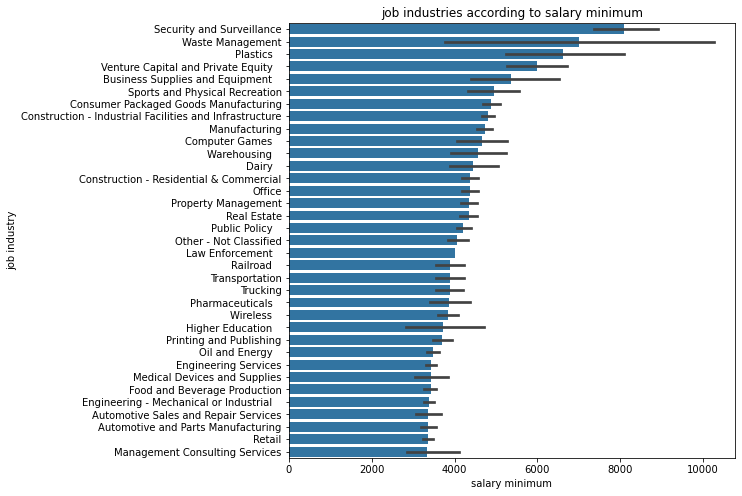

In [45]:
plt.figure(figsize=[8,8])
result = final_df.groupby(["job_industry"])['salary_minimum'].aggregate(np.mean).reset_index().sort_values('salary_minimum',ascending=False);
result=result.head(35)
sb.barplot(y='job_industry',x="salary_minimum", data=final_df, order=result['job_industry'],color=blue);
plt.title('job industries according to salary minimum');
plt.ylabel('job industry');
plt.xlabel('salary minimum');

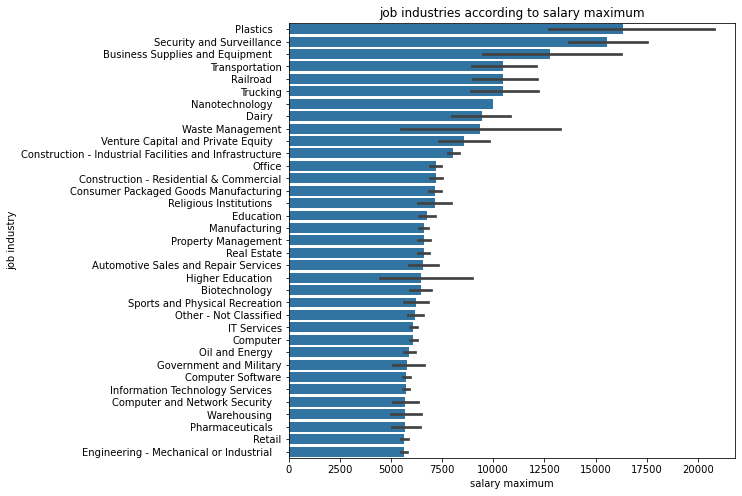

In [46]:
plt.figure(figsize=[8,8])
result = final_df.groupby(["job_industry"])['salary_maximum'].aggregate(np.mean).reset_index().sort_values('salary_maximum',ascending=False);
result=result.head(35)
sb.barplot(y='job_industry',x="salary_maximum", data=final_df, order=result['job_industry'],color=blue);
plt.title('job industries according to salary maximum');
plt.ylabel('job industry');
plt.xlabel('salary maximum');


# 

### If I'm a company that wants to post a job, which month can I post? 

###### I recommend posting in September but if you have to post it quickly just don't post it on may 
### Marks:
###### Points
### Channels:
###### Vertically-Horizontal
### Task:
##### Find trends

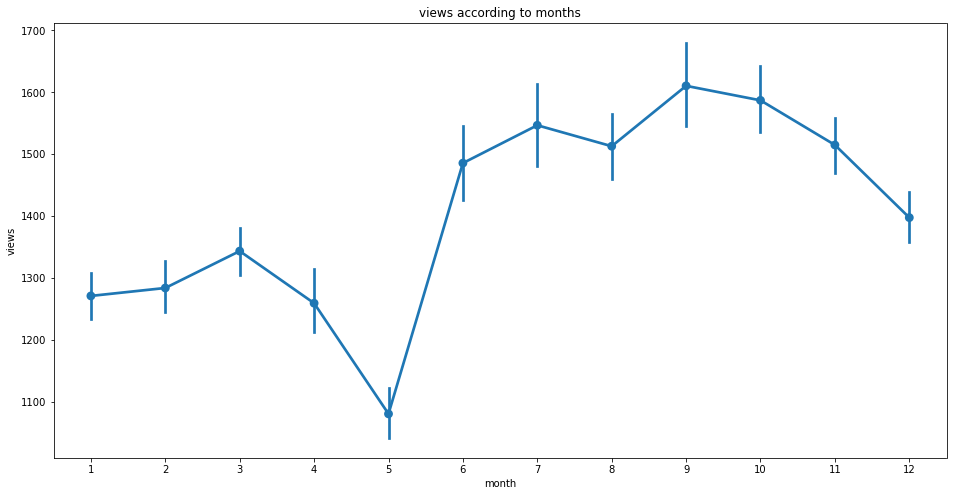

In [47]:
plt.figure(figsize=[16,8]);
sb.pointplot(data=df_1,x='month',y='views');
plt.title('views according to months');

In [48]:
final_df['salary_maximum'].value_counts()

3000     19546
5000     17765
4000     15075
2500     14333
2000     11539
         ...  
750          1
8690         1
28000        1
1050         1
5900         1
Name: salary_maximum, Length: 140, dtype: int64

# 

In [49]:
timesData = pd.read_csv('timesData.csv')

In [50]:
timesData.head(10)

,world_rank,university_name,country,teaching,international,research,citations,income,total_score,num_students,student_staff_ratio,international_students,female_male_ratio,year
0,1,Harvard University,United States of America,99.7,72.4,98.7,98.8,34.5,96.1,"20,152",8.9,25%,NaN,2011
1,2,California Institute of Technology,United States of America,97.7,54.6,98.0,99.9,83.7,96.0,"2,243",6.9,27%,33 : 67,2011
2,3,Massachusetts Institute of Technology,United States of America,97.8,82.3,91.4,99.9,87.5,95.6,"11,074",9.0,33%,37 : 63,2011
3,4,Stanford University,United States of America,98.3,29.5,98.1,99.2,64.3,94.3,"15,596",7.8,22%,42 : 58,2011
4,5,Princeton University,United States of America,90.9,70.3,95.4,99.9,-,94.2,"7,929",8.4,27%,45 : 55,2011
5,6,University of Cambridge,United Kingdom,90.5,77.7,94.1,94.0,57.0,91.2,"18,812",11.8,34%,46 : 54,2011
6,6,University of Oxford,United Kingdom,88.2,77.2,93.9,95.1,73.5,91.2,"19,919",11.6,34%,46 : 54,2011
7,8,"University of California, Berkeley",United States of America,84.2,39.6,99.3,97.8,-,91.1,"36,186",16.4,15%,50 : 50,2011
8,9,Imperial College London,United Kingdom,89.2,90.0,94.5,88.3,92.9,90.6,"15,060",11.7,51%,37 : 63,2011
9,10,Yale University,United States of America,92.1,59.2,89.7,91.5,-,89.5,"11,751",4.4,20%,50 : 50,2011


### Compare Citation and Teaching vs World Rank of Top 100 Universities
### Marks:
###### Points
### Channels:
###### Vertically-Horizontal-Color
### Task:
##### Find Trends

In [51]:
from plotly.offline import init_notebook_mode, iplot, plot
# prepare data frame
df = timesData.iloc[:100,:]

# import graph objects as "go"
import plotly.graph_objs as go

# Creating trace1
trace1 = go.Scatter(
                    x = df.world_rank,
                    y = df.citations,
                    mode = "lines",
                    name = "citations",
                    marker = dict(color = 'rgba(16, 112, 2, 0.8)'),
                    text= df.university_name)
# Creating trace2
trace2 = go.Scatter(
                    x = df.world_rank,
                    y = df.teaching,
                    mode = "lines+markers",
                    name = "teaching",
                    marker = dict(color = 'rgba(80, 26, 80, 0.8)'),
                    text= df.university_name)
data = [trace1, trace2]
layout = dict(title = 'Citation and Teaching vs World Rank of Top 100 Universities',
              xaxis= dict(title= 'World Rank',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

###  University world rank (first 20) vs teaching score with number of students(size) and international score (color) in 2016
### Marks:
###### Points
### Channels:
###### Vertically-Horizontal-Color-Size
### Task:
##### find trends, outliers

In [52]:
df2016 = timesData[timesData.year == 2016].iloc[:20,:]
num_students_size  = [float(each.replace(',', '.')) for each in df2016.num_students]
international_color = [float(each) for each in df2016.international]
data = [
    {
        'y': df2016.teaching,
        'x': df2016.world_rank,
        'mode': 'markers',
        'marker': {
            'color': international_color,
            'size': num_students_size,
            'showscale': True
        },
        "text" :  df2016.university_name    
    }
]
iplot(data)

### show the difference between students-staff ratio in 2011 and 2012
### Marks:
###### lines
### Channels:
###### Horizontal-Color
### Task:
##### compare, lookup values

In [53]:
x2011 = timesData.student_staff_ratio[timesData.year == 2011]
x2012 = timesData.student_staff_ratio[timesData.year == 2012]

trace1 = go.Histogram(
    x=x2011,
    opacity=0.75,
    name = "2011",
    marker=dict(color='rgba(171, 50, 96, 0.6)'))
trace2 = go.Histogram(
    x=x2012,
    opacity=0.75,
    name = "2012",
    marker=dict(color='rgba(12, 50, 196, 0.6)'))

data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
                   title=' students-staff ratio in 2011 and 2012',
                   xaxis=dict(title='students-staff ratio'),
                   yaxis=dict( title='Count'),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

# Thank you!

In [2]:
!jupyter nbconvert slideshow.ipynb --to slides --post serve  --no-input --no-prompt

[NbConvertApp] Converting notebook slideshow.ipynb to slides
[NbConvertApp] Writing 8056395 bytes to slideshow.slides.html
[NbConvertApp] Redirecting reveal.js requests to https://cdnjs.cloudflare.com/ajax/libs/reveal.js/3.5.0
Traceback (most recent call last):
  File "C:\Users\ahmed\anaconda3\Scripts\jupyter-nbconvert-script.py", line 10, in <module>
    sys.exit(main())
  File "C:\Users\ahmed\anaconda3\lib\site-packages\jupyter_core\application.py", line 270, in launch_instance
    return super(JupyterApp, cls).launch_instance(argv=argv, **kwargs)
  File "C:\Users\ahmed\anaconda3\lib\site-packages\traitlets\config\application.py", line 664, in launch_instance
    app.start()
  File "C:\Users\ahmed\anaconda3\lib\site-packages\nbconvert\nbconvertapp.py", line 340, in start
    self.convert_notebooks()
  File "C:\Users\ahmed\anaconda3\lib\site-packages\nbconvert\nbconvertapp.py", line 510, in convert_notebooks
    self.convert_single_notebook(notebook_filename)
  File "C:\Users\ahmed\an